In [ ]:
!pip install tensorflow-addons==0.16.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 5.0 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.5.0
    Uninstalling typing_extensions-4.5.0:
      Successfully uninstalled typing_extensions-4.5.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-probability 0.22.0 requires typing-extensions<4.6.0, but you have typing-extensions 4.9.0 which is incompatible.


In [ ]:
import tensorflow as tf
import tensorflow_addons as tfa
import math

import pandas as pd
import cv2
from PIL import Image
import numpy as np
import os
import matplotlib.pyplot as plt

from tensorflow import keras
from tensorflow.keras import layers

from tensorflow.keras.models import Model,load_model
from tensorflow.keras.optimizers import Adam, RMSprop

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.6.0 and strictly below 2.9.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.15.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


In [ ]:
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()
print('Number of replicas:', strategy.num_replicas_in_sync)

Number of replicas: 1


In [ ]:
# Mount google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
tfrec_yes_path = '/content/drive/MyDrive/Data split skripsi/tfrecord/yes_data.tfrecord'
tfrec_no_path = '/content/drive/MyDrive/Data split skripsi/tfrecord/no_data.tfrecord'

In [ ]:
YES_FILENAMES = tf.io.gfile.glob(tfrec_yes_path)
print('Yes TFRecord Files:', len(YES_FILENAMES))

NO_FILENAMES = tf.io.gfile.glob(tfrec_no_path)
print('No TFRecord Files:', len(NO_FILENAMES))

Yes TFRecord Files: 1
No TFRecord Files: 1


In [ ]:
IMAGE_SIZE = [256, 256]

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.int64)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

In [ ]:
def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    # dataset = dataset.shuffle(1000)
    return dataset

In [ ]:
yes_ds = load_dataset(YES_FILENAMES, labeled=True).batch(1)
no_ds = load_dataset(NO_FILENAMES, labeled=True).batch(1)

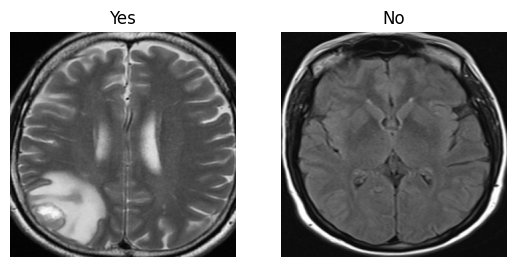

In [ ]:
example_yes = next(iter(yes_ds))
example_no = next(iter(no_ds))

plt.subplot(121)
plt.title('Yes')
plt.axis('off')
plt.imshow(example_yes[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('No')
plt.axis('off')
plt.imshow(example_no[0] * 0.5 + 0.5)

In [ ]:
OUTPUT_CHANNELS = 3

def downsample(filters, size, apply_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_instancenorm:
        result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    result.add(layers.LeakyReLU())

    return result

In [ ]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.ReLU())

    return result

In [ ]:
def Generator():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample(64, 4, apply_instancenorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

In [ ]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv)

    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

In [ ]:
# with strategy.scope():
#     yes_generator = Generator() # transforms tumor to be more like non-tumor
#     no_generator = Generator() # transforms non-tumor to be more like tumor

#     yes_discriminator = Discriminator() # differentiates real tumor images and generated tumor images
#     no_discriminator = Discriminator() # differentiates real non-tumor images and generated non-tumor images

with strategy.scope():
    yes_generator = load_model('/content/drive/MyDrive/Tumor otak/generator_cyclegan_yes_50_FINAL_c.h5') # transforms tumor to be more like non-tumor
    no_generator = load_model('/content/drive/MyDrive/Tumor otak/generator_cyclegan_no_50_FINAL_c.h5') # transforms non-tumor to be more like tumor

    yes_discriminator = load_model('/content/drive/MyDrive/Tumor otak/discriminator_cyclegan_yes_50_FINAL_c.h5') # differentiates real tumor images and generated tumor images
    no_discriminator = load_model('/content/drive/MyDrive/Tumor otak/discriminator_cyclegan_no_50_FINAL_c.h5') # differentiates real non-tumor images and generated non-tumor images

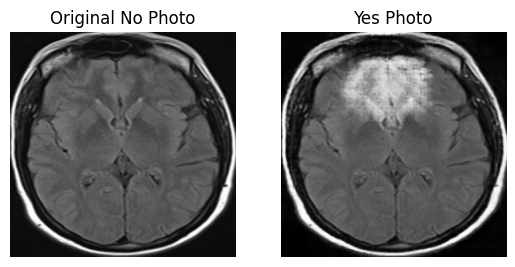

In [ ]:
to_yes = yes_generator(example_no)

plt.subplot(1, 2, 1)
plt.title("Original No Photo")
plt.axis("off")
plt.imshow(example_no[0] * 0.5 + 0.5)

plt.subplot(1, 2, 2)
plt.title("Yes Photo")
plt.axis("off")
plt.imshow(to_yes[0] * 0.5 + 0.5)
plt.show()

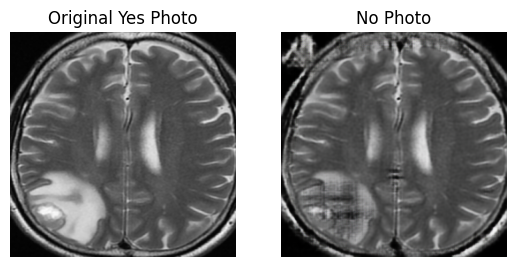

In [ ]:
to_no = no_generator(example_yes)

plt.subplot(1, 2, 1)
plt.title("Original Yes Photo")
plt.axis("off")
plt.imshow(example_yes[0] * 0.5 + 0.5)

plt.subplot(1, 2, 2)
plt.title("No Photo")
plt.axis("off")
plt.imshow(to_no[0] * 0.5 + 0.5)
plt.show()

In [ ]:
class CycleGan(keras.Model):
    def __init__(
        self,
        yes_generator,
        no_generator,
        yes_discriminator,
        no_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = yes_generator
        self.p_gen = no_generator
        self.m_disc = yes_discriminator
        self.p_disc = no_discriminator
        self.lambda_cycle = lambda_cycle

    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn

    def train_step(self, batch_data):
        real_yes, real_no = batch_data

        with tf.GradientTape(persistent=True) as tape:
            # no to yes back to no
            fake_yes = self.m_gen(real_no, training=True)
            cycled_no = self.p_gen(fake_yes, training=True)

            # yes to no back to yes
            fake_no = self.p_gen(real_yes, training=True)
            cycled_yes = self.m_gen(fake_no, training=True)

            # generating itself
            same_yes = self.m_gen(real_yes, training=True)
            same_no = self.p_gen(real_no, training=True)

            # discriminator used to check, inputing real images
            disc_real_yes = self.m_disc(real_yes, training=True)
            disc_real_no = self.p_disc(real_no, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_yes = self.m_disc(fake_yes, training=True)
            disc_fake_no = self.p_disc(fake_no, training=True)

            # evaluates generator loss
            yes_gen_loss = self.gen_loss_fn(disc_fake_yes)
            no_gen_loss = self.gen_loss_fn(disc_fake_no)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_yes, cycled_yes, self.lambda_cycle) + self.cycle_loss_fn(real_no, cycled_no, self.lambda_cycle)

            # evaluates total generator loss
            total_yes_gen_loss = yes_gen_loss + total_cycle_loss + self.identity_loss_fn(real_yes, same_yes, self.lambda_cycle)
            total_no_gen_loss = no_gen_loss + total_cycle_loss + self.identity_loss_fn(real_no, same_no, self.lambda_cycle)

            # evaluates discriminator loss
            yes_disc_loss = self.disc_loss_fn(disc_real_yes, disc_fake_yes)
            no_disc_loss = self.disc_loss_fn(disc_real_no, disc_fake_no)

        # Calculate the gradients for generator and discriminator
        yes_generator_gradients = tape.gradient(total_yes_gen_loss,
                                                  self.m_gen.trainable_variables)
        no_generator_gradients = tape.gradient(total_no_gen_loss,
                                                  self.p_gen.trainable_variables)

        yes_discriminator_gradients = tape.gradient(yes_disc_loss,
                                                      self.m_disc.trainable_variables)
        no_discriminator_gradients = tape.gradient(no_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(yes_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(no_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(yes_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(no_discriminator_gradients,
                                                  self.p_disc.trainable_variables))

        return {
            "yes_gen_loss": total_yes_gen_loss,
            "no_gen_loss": total_no_gen_loss,
            "yes_disc_loss": yes_disc_loss,
            "no_disc_loss": no_disc_loss
        }

In [ ]:
with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5

In [ ]:
with strategy.scope():
    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

In [ ]:
with strategy.scope():
    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1

In [ ]:
with strategy.scope():
    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

In [ ]:
with strategy.scope():
    yes_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    no_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    yes_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    no_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
with strategy.scope():
    cycle_gan_model = CycleGan(
        yes_generator, no_generator, yes_discriminator, no_discriminator
    )

    cycle_gan_model.compile(
        m_gen_optimizer = yes_generator_optimizer,
        p_gen_optimizer = no_generator_optimizer,
        m_disc_optimizer = yes_discriminator_optimizer,
        p_disc_optimizer = no_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

Training 20

In [ ]:
history = cycle_gan_model.fit(
    tf.data.Dataset.zip((yes_ds, no_ds)),
    epochs=20
)

Epoch 1/20
68/68 [==============================] - 95s 506ms/step - yes_gen_loss: 6.7506 - no_gen_loss: 6.7586 - yes_disc_loss: 0.6689 - no_disc_loss: 0.6793
Epoch 2/20
68/68 [==============================] - 33s 483ms/step - yes_gen_loss: 2.9855 - no_gen_loss: 2.8052 - yes_disc_loss: 0.5692 - no_disc_loss: 0.6919
Epoch 3/20
68/68 [==============================] - 33s 485ms/step - yes_gen_loss: 2.7956 - no_gen_loss: 2.4554 - yes_disc_loss: 0.5308 - no_disc_loss: 0.6887
Epoch 4/20
68/68 [==============================] - 33s 485ms/step - yes_gen_loss: 2.4153 - no_gen_loss: 2.2613 - yes_disc_loss: 0.6504 - no_disc_loss: 0.6817
Epoch 5/20
68/68 [==============================] - 33s 485ms/step - yes_gen_loss: 2.2623 - no_gen_loss: 2.1591 - yes_disc_loss: 0.6453 - no_disc_loss: 0.6580
Epoch 6/20
68/68 [==============================] - 33s 484ms/step - yes_gen_loss: 2.1604 - no_gen_loss: 2.1201 - yes_disc_loss: 0.6470 - no_disc_loss: 0.6269
Epoch 7/20
68/68 [============================

In [ ]:
# yes_generator.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
# no_generator.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
# yes_discriminator.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
# no_discriminator.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

yes_generator.save('/content/drive/MyDrive/Tumor otak/generator_cyclegan_yes_20_FINAL_c.h5')
no_generator.save('/content/drive/MyDrive/Tumor otak/generator_cyclegan_no_20_FINAL_c.h5')
yes_discriminator.save('/content/drive/MyDrive/Tumor otak/discriminator_cyclegan_yes_20_FINAL_c.h5')
no_discriminator.save('/content/drive/MyDrive/Tumor otak/discriminator_cyclegan_no_20_FINAL_c.h5')

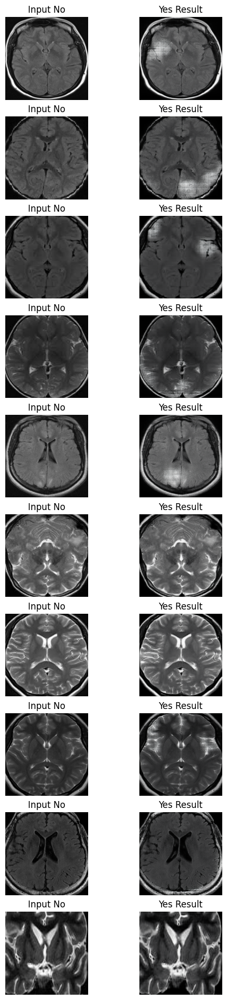

In [ ]:
_, ax = plt.subplots(10, 2, figsize=(6, 24))
for i, img in enumerate(no_ds.take(10)):
    prediction = yes_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input No")
    ax[i, 1].set_title("Yes Result")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

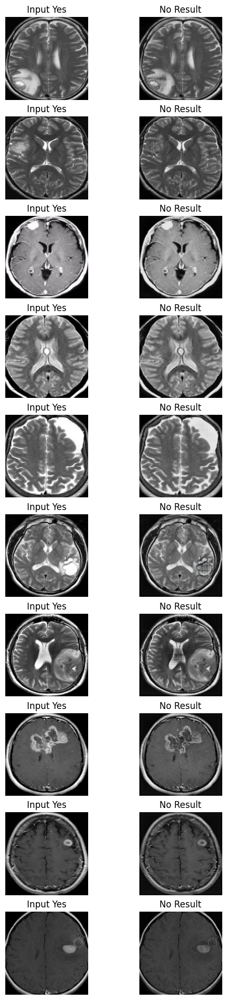

In [ ]:
_, ax = plt.subplots(10, 2, figsize=(6, 24))
for i, img in enumerate(yes_ds.take(10)):
    prediction = no_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Yes")
    ax[i, 1].set_title("No Result")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

50

In [ ]:
with strategy.scope():
    cycle_gan_model = CycleGan(
        yes_generator, no_generator, yes_discriminator, no_discriminator
    )

    cycle_gan_model.compile(
        m_gen_optimizer = yes_generator_optimizer,
        p_gen_optimizer = no_generator_optimizer,
        m_disc_optimizer = yes_discriminator_optimizer,
        p_disc_optimizer = no_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

In [ ]:
history = cycle_gan_model.fit(
    tf.data.Dataset.zip((yes_ds, no_ds)),
    epochs=50
)

Epoch 1/50
68/68 [==============================] - 149s 580ms/step - yes_gen_loss: 6.5366 - no_gen_loss: 6.5241 - yes_disc_loss: 0.6743 - no_disc_loss: 0.6804
Epoch 2/50
68/68 [==============================] - 32s 463ms/step - yes_gen_loss: 2.8324 - no_gen_loss: 2.8333 - yes_disc_loss: 0.6371 - no_disc_loss: 0.6041
Epoch 3/50
68/68 [==============================] - 31s 456ms/step - yes_gen_loss: 2.6435 - no_gen_loss: 2.6088 - yes_disc_loss: 0.5588 - no_disc_loss: 0.5983
Epoch 4/50
68/68 [==============================] - 31s 460ms/step - yes_gen_loss: 2.4003 - no_gen_loss: 2.1947 - yes_disc_loss: 0.6196 - no_disc_loss: 0.6992
Epoch 5/50
68/68 [==============================] - 31s 458ms/step - yes_gen_loss: 2.2255 - no_gen_loss: 2.0980 - yes_disc_loss: 0.6444 - no_disc_loss: 0.6767
Epoch 6/50
68/68 [==============================] - 31s 458ms/step - yes_gen_loss: 2.1221 - no_gen_loss: 2.0101 - yes_disc_loss: 0.6466 - no_disc_loss: 0.6824
Epoch 7/50
68/68 [===========================

In [ ]:
# yes_generator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
# no_generator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
# yes_discriminator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
# no_discriminator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

yes_generator.save('/content/drive/MyDrive/Tumor otak/generator_cyclegan_yes_50_FINAL_c.h5')
no_generator.save('/content/drive/MyDrive/Tumor otak/generator_cyclegan_no_50_FINAL_c.h5')
yes_discriminator.save('/content/drive/MyDrive/Tumor otak/discriminator_cyclegan_yes_50_FINAL_c.h5')
no_discriminator.save('/content/drive/MyDrive/Tumor otak/discriminator_cyclegan_no_50_FINAL_c.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
/usr/local/lib/python3.10/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(


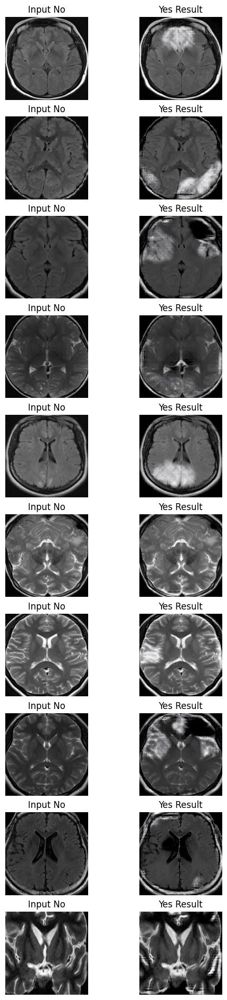

In [ ]:
_, ax = plt.subplots(10, 2, figsize=(6, 24))
for i, img in enumerate(no_ds.take(10)):
    prediction = yes_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input No")
    ax[i, 1].set_title("Yes Result")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

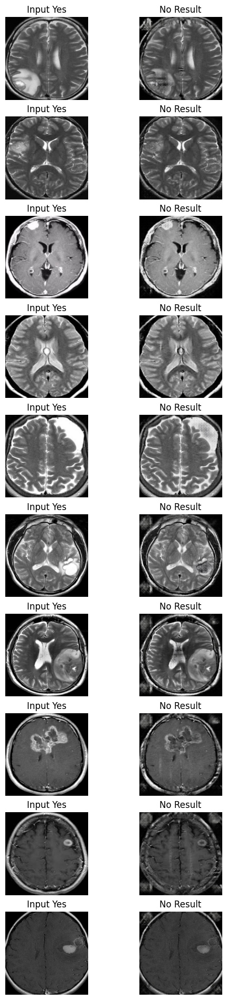

In [ ]:
_, ax = plt.subplots(10, 2, figsize=(6, 24))
for i, img in enumerate(yes_ds.take(10)):
    prediction = no_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Yes")
    ax[i, 1].set_title("No Result")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

100

In [ ]:
history = cycle_gan_model.fit(
    tf.data.Dataset.zip((yes_ds, no_ds)),
    epochs=50
)

Epoch 1/50
68/68 [==============================] - 91s 476ms/step - yes_gen_loss: 1.6576 - no_gen_loss: 1.6552 - yes_disc_loss: 0.6236 - no_disc_loss: 0.6101
Epoch 2/50
68/68 [==============================] - 32s 470ms/step - yes_gen_loss: 1.6366 - no_gen_loss: 1.6351 - yes_disc_loss: 0.6261 - no_disc_loss: 0.6147
Epoch 3/50
68/68 [==============================] - 32s 469ms/step - yes_gen_loss: 1.6502 - no_gen_loss: 1.6518 - yes_disc_loss: 0.6247 - no_disc_loss: 0.6149
Epoch 4/50
68/68 [==============================] - 32s 467ms/step - yes_gen_loss: 1.6879 - no_gen_loss: 1.6904 - yes_disc_loss: 0.6228 - no_disc_loss: 0.6114
Epoch 5/50
68/68 [==============================] - 32s 464ms/step - yes_gen_loss: 1.6702 - no_gen_loss: 1.6683 - yes_disc_loss: 0.6262 - no_disc_loss: 0.6168
Epoch 6/50
68/68 [==============================] - 32s 472ms/step - yes_gen_loss: 1.6756 - no_gen_loss: 1.6704 - yes_disc_loss: 0.6253 - no_disc_loss: 0.6181
Epoch 7/50
68/68 [============================

In [ ]:
# yes_generator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
# no_generator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
# yes_discriminator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
# no_discriminator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

yes_generator.save('/content/drive/MyDrive/Tumor otak/generator_cyclegan_yes_100_FINAL_c.h5')
no_generator.save('/content/drive/MyDrive/Tumor otak/generator_cyclegan_no_100_FINAL_c.h5')
yes_discriminator.save('/content/drive/MyDrive/Tumor otak/discriminator_cyclegan_yes_100_FINAL_c.h5')
no_discriminator.save('/content/drive/MyDrive/Tumor otak/discriminator_cyclegan_no_100_FINAL_c.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


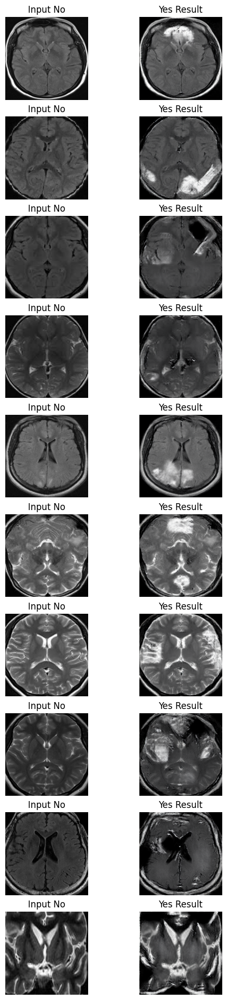

In [ ]:
_, ax = plt.subplots(10, 2, figsize=(6, 24))
for i, img in enumerate(no_ds.take(10)):
    prediction = yes_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input No")
    ax[i, 1].set_title("Yes Result")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

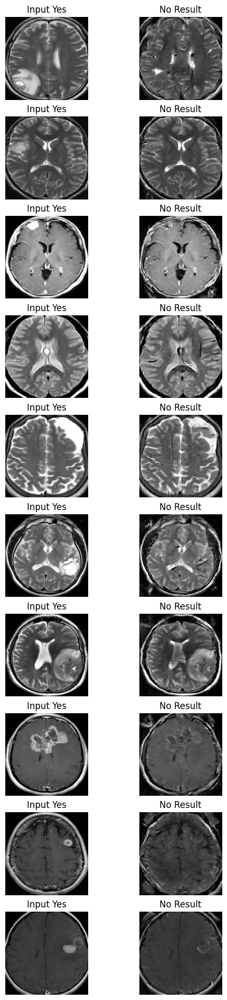

In [ ]:
_, ax = plt.subplots(10, 2, figsize=(6, 24))
for i, img in enumerate(yes_ds.take(10)):
    prediction = no_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Yes")
    ax[i, 1].set_title("No Result")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

150

In [ ]:
history = cycle_gan_model.fit(
    tf.data.Dataset.zip((yes_ds, no_ds)),
    epochs=50
)

Epoch 1/50
68/68 [==============================] - 32s 463ms/step - yes_gen_loss: 1.7291 - no_gen_loss: 1.7446 - yes_disc_loss: 0.6043 - no_disc_loss: 0.5777
Epoch 2/50
68/68 [==============================] - 31s 458ms/step - yes_gen_loss: 1.7255 - no_gen_loss: 1.7544 - yes_disc_loss: 0.6005 - no_disc_loss: 0.5856
Epoch 3/50
68/68 [==============================] - 31s 457ms/step - yes_gen_loss: 1.7351 - no_gen_loss: 1.7605 - yes_disc_loss: 0.6010 - no_disc_loss: 0.5813
Epoch 4/50
68/68 [==============================] - 31s 456ms/step - yes_gen_loss: 1.7390 - no_gen_loss: 1.7597 - yes_disc_loss: 0.5990 - no_disc_loss: 0.5729
Epoch 5/50
68/68 [==============================] - 31s 458ms/step - yes_gen_loss: 1.7529 - no_gen_loss: 1.7885 - yes_disc_loss: 0.5962 - no_disc_loss: 0.5823
Epoch 6/50
68/68 [==============================] - 31s 457ms/step - yes_gen_loss: 1.7414 - no_gen_loss: 1.7682 - yes_disc_loss: 0.5972 - no_disc_loss: 0.5744
Epoch 7/50
68/68 [============================

In [ ]:
# yes_generator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
# no_generator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
# yes_discriminator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
# no_discriminator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

yes_generator.save('/content/drive/MyDrive/Tumor otak/generator_cyclegan_yes_150_FINAL_c.h5')
no_generator.save('/content/drive/MyDrive/Tumor otak/generator_cyclegan_no_150_FINAL_c.h5')
yes_discriminator.save('/content/drive/MyDrive/Tumor otak/discriminator_cyclegan_yes_150_FINAL_c.h5')
no_discriminator.save('/content/drive/MyDrive/Tumor otak/discriminator_cyclegan_no_150_FINAL_c.h5')

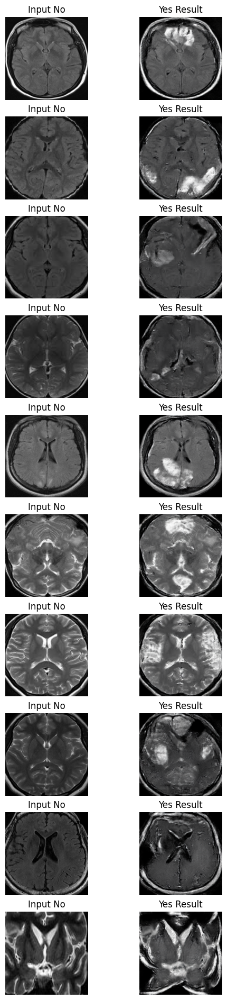

In [ ]:
_, ax = plt.subplots(10, 2, figsize=(6, 24))
for i, img in enumerate(no_ds.take(10)):
    prediction = yes_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input No")
    ax[i, 1].set_title("Yes Result")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

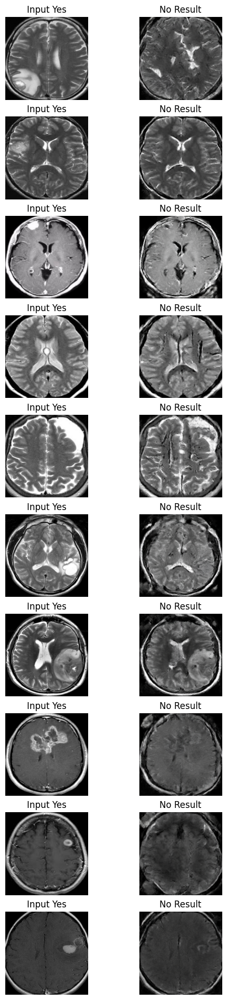

In [ ]:
_, ax = plt.subplots(10, 2, figsize=(6, 24))
for i, img in enumerate(yes_ds.take(10)):
    prediction = no_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Yes")
    ax[i, 1].set_title("No Result")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

200

In [ ]:
history = cycle_gan_model.fit(
    tf.data.Dataset.zip((yes_ds, no_ds)),
    epochs=50
)

Epoch 1/50
68/68 [==============================] - 32s 462ms/step - yes_gen_loss: 1.8217 - no_gen_loss: 1.8792 - yes_disc_loss: 0.5710 - no_disc_loss: 0.5305
Epoch 2/50
68/68 [==============================] - 31s 457ms/step - yes_gen_loss: 1.8208 - no_gen_loss: 1.8831 - yes_disc_loss: 0.5654 - no_disc_loss: 0.5237
Epoch 3/50
68/68 [==============================] - 31s 457ms/step - yes_gen_loss: 1.8121 - no_gen_loss: 1.8748 - yes_disc_loss: 0.5556 - no_disc_loss: 0.5176
Epoch 4/50
68/68 [==============================] - 31s 456ms/step - yes_gen_loss: 1.8311 - no_gen_loss: 1.8876 - yes_disc_loss: 0.5621 - no_disc_loss: 0.5153
Epoch 5/50
68/68 [==============================] - 31s 457ms/step - yes_gen_loss: 1.8404 - no_gen_loss: 1.8949 - yes_disc_loss: 0.5626 - no_disc_loss: 0.5170
Epoch 6/50
68/68 [==============================] - 31s 458ms/step - yes_gen_loss: 1.8348 - no_gen_loss: 1.9061 - yes_disc_loss: 0.5580 - no_disc_loss: 0.5299
Epoch 7/50
68/68 [============================

In [ ]:
# yes_generator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
# no_generator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
# yes_discriminator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
# no_discriminator.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

yes_generator.save('/content/drive/MyDrive/Tumor otak/generator_cyclegan_yes_200_FINAL_c.h5')
no_generator.save('/content/drive/MyDrive/Tumor otak/generator_cyclegan_no_200_FINAL_c.h5')
yes_discriminator.save('/content/drive/MyDrive/Tumor otak/discriminator_cyclegan_yes_200_FINAL_c.h5')
no_discriminator.save('/content/drive/MyDrive/Tumor otak/discriminator_cyclegan_no_200_FINAL_c.h5')

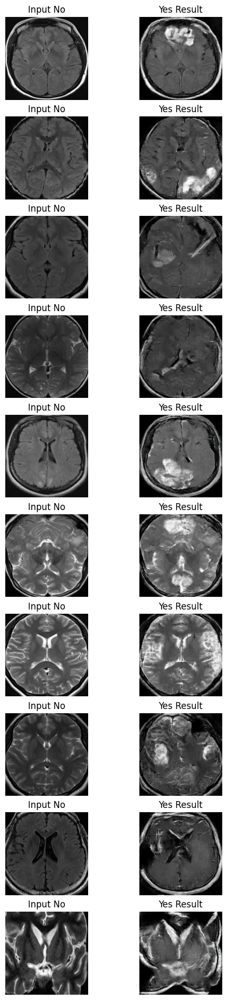

In [ ]:
_, ax = plt.subplots(10, 2, figsize=(6, 24))
for i, img in enumerate(no_ds.take(10)):
    prediction = yes_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input No")
    ax[i, 1].set_title("Yes Result")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

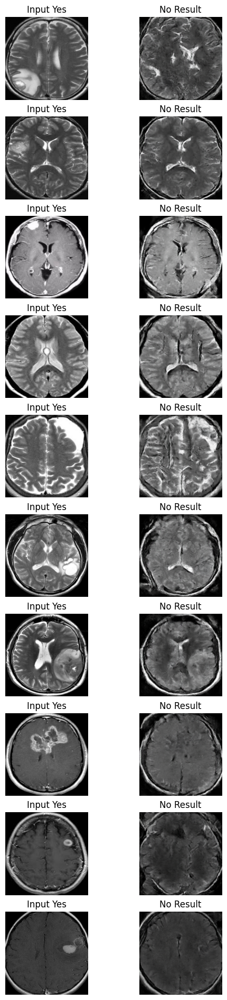

In [ ]:
_, ax = plt.subplots(10, 2, figsize=(6, 24))
for i, img in enumerate(yes_ds.take(10)):
    prediction = no_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Yes")
    ax[i, 1].set_title("No Result")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

asd

In [ ]:
yes_gen_loss = [6.7269, 2.8890, 2.5666, 2.3986, 2.2918, 2.1332, 2.0486, 1.9864, 1.9337, 1.8895, 1.8617, 1.8237, 1.8208, 1.7848, 1.7633, 1.7536, 1.7432, 1.7320, 1.7160, 1.7345, 1.7201, 1.6988, 1.7116, 1.6997, 1.6864, 1.6737, 1.6844, 1.6760, 1.6607, 1.6661, 1.6730, 1.6619, 1.6538, 1.6615, 1.6639, 1.6719, 1.6466, 1.6692, 1.6507, 1.6747, 1.6487, 1.6382, 1.6586, 1.6606, 1.6509, 1.6514, 1.6661, 1.6679, 1.6612, 1.6483]
no_gen_loss = [6.7663, 2.7900, 2.4328, 2.3454, 2.1927, 2.0342, 1.9732, 1.9385, 1.9040, 1.8761, 1.8473, 1.8183, 1.8118, 1.7850, 1.7649, 1.7518, 1.7454, 1.7358, 1.7214, 1.7452, 1.7300, 1.7097, 1.7184, 1.7057, 1.6919, 1.6841, 1.6888, 1.6852, 1.6719, 1.6746, 1.6770, 1.6574, 1.6477, 1.6552, 1.6550, 1.6492, 1.6237, 1.6420, 1.6262, 1.6532, 1.6301, 1.6154, 1.6367, 1.6411, 1.6372, 1.6366, 1.6562, 1.6599, 1.6598, 1.6429]

In [ ]:
epoch_range = list(range(1, 51))

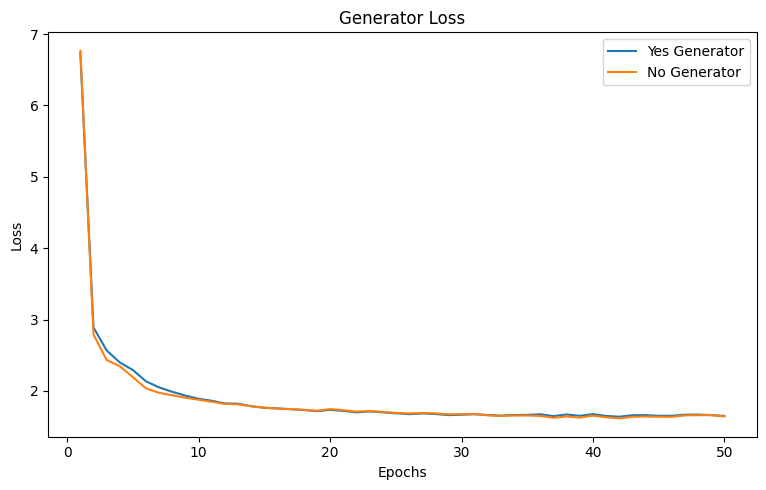

In [ ]:
# plot model performance
# epochs_range = range(1, len(history.epoch) + 1)

plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(epoch_range, yes_gen_loss, label='Yes Generator')
plt.plot(epoch_range, no_gen_loss, label='No Generator')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Generator Loss')

# plt.subplot(1, 2, 2)
# plt.plot(epochs_range, yes_disc_loss, label='Yes Discriminator')
# plt.plot(epochs_range, no_disc_loss, label='No Discriminator')
# plt.legend(loc="best")
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.title('Discriminator Loss')

plt.tight_layout()
plt.show()

In [ ]:
yes_gen_loss

[2.6183367,
 2.6375027,
 2.6538851,
 2.359451,
 2.3493552,
 2.2847188,
 2.2160218,
 2.1855917,
 2.1180022,
 1.9318428,
 1.8105108,
 1.773916,
 1.6396786,
 1.5813017,
 1.5994692,
 1.48157,
 1.4456254,
 1.4562626,
 1.3928133,
 1.4233372,
 1.4169427,
 1.5769469,
 1.4204718,
 1.4315633,
 1.4749237,
 1.4305506,
 1.428706,
 1.473851,
 1.4884651,
 1.5412564,
 1.4085271,
 1.3847482,
 1.4326862,
 1.4069378,
 1.3370712,
 1.3858184,
 1.3397417,
 1.3714046,
 1.337044,
 1.4715091,
 1.3608232,
 1.3771608,
 1.3170611,
 1.3478814,
 1.365477,
 1.4664934,
 1.3956022,
 1.4311976,
 1.475913,
 1.4078426]

In [ ]:
no_gen_loss

[2.6894467,
 2.5387104,
 1.8554765,
 1.7127587,
 1.6471322,
 1.6067005,
 1.5492351,
 1.4917157,
 1.4705902,
 1.5102981,
 1.4812088,
 1.5174927,
 1.3899944,
 1.349897,
 1.295166,
 1.3124094,
 1.3106669,
 1.3559451,
 1.2813569,
 1.305588,
 1.2983596,
 1.4741398,
 1.3072747,
 1.3520967,
 1.3312517,
 1.3419679,
 1.319905,
 1.337178,
 1.3584576,
 1.4226723,
 1.3149582,
 1.4215598,
 1.4106238,
 1.3980703,
 1.3442204,
 1.4184412,
 1.3947048,
 1.4311534,
 1.4169891,
 1.4481202,
 1.412704,
 1.4046441,
 1.3732907,
 1.4250374,
 1.4568725,
 1.569975,
 1.5056652,
 1.5472395,
 1.5510541,
 1.5687374]

In [ ]:
yes_disc_loss

[0.69521105,
 0.46274573,
 0.51608396,
 0.6288882,
 0.6449669,
 0.64229816,
 0.6458904,
 0.6426259,
 0.64527303,
 0.6778204,
 0.6882551,
 0.71026534,
 0.69262135,
 0.6936221,
 0.6674072,
 0.70327455,
 0.7043945,
 0.71571654,
 0.70950454,
 0.7381715,
 0.7359163,
 0.7069699,
 0.7154716,
 0.71674764,
 0.7189898,
 0.72636825,
 0.72172666,
 0.7345551,
 0.73729825,
 0.7386894,
 0.74926317,
 0.753836,
 0.7498965,
 0.76687485,
 0.7667433,
 0.78749245,
 0.7923686,
 0.78366846,
 0.7921937,
 0.7760251,
 0.822181,
 0.80543154,
 0.81656307,
 0.8179272,
 0.80598557,
 0.8020704,
 0.800253,
 0.8074945,
 0.80933934,
 0.82715744]

In [ ]:
no_disc_loss

[0.6915121,
 0.39912754,
 0.71995145,
 0.72521615,
 0.72268337,
 0.7160131,
 0.7294838,
 0.73714674,
 0.74611753,
 0.73789144,
 0.73687035,
 0.7311524,
 0.7221001,
 0.71971077,
 0.71362317,
 0.7093984,
 0.70476604,
 0.7031437,
 0.69995,
 0.7242496,
 0.72010094,
 0.730194,
 0.7152893,
 0.7037342,
 0.7398589,
 0.7299041,
 0.7368237,
 0.748346,
 0.7508089,
 0.79401094,
 0.7934141,
 0.7534521,
 0.75392795,
 0.7760576,
 0.775491,
 0.76802737,
 0.7571962,
 0.7386621,
 0.73295844,
 0.74883693,
 0.72249824,
 0.7371259,
 0.7289508,
 0.7335412,
 0.7340271,
 0.7066093,
 0.70386904,
 0.7143756,
 0.7032727,
 0.68848044]

Save generated image

In [ ]:
from os import listdir

In [ ]:
def load_data_train(dir_list, image_size):
    X = []
    y = []
    image_width, image_height = image_size

    for directory in dir_list:
        for filename in listdir(directory):
            image = Image.open(directory + '/' + filename).convert('RGB')
            image = np.array(image)
            # trimmed = trim(im)
            # image = gaussian_blur(image)
            # image = crop_mri(image, plot=False)
            image = cv2.resize(image, dsize=(image_width, image_height), interpolation=cv2.INTER_CUBIC)

            X.append(image)

            # Jika direktori asal memiliki nama 'yes' maka akan diberi label 1,
            # Jika bukan maka diberi label 0
            if(directory[-3:] == 'yes'):
                y.append([1])
            else:
                y.append([0])

    X = np.array(X)
    y = np.array(y)

    print(f'Number of examples is: {len(X)}')
    print(f'X shape is: {X.shape}')
    print(f'y shape is: {y.shape}')

    return X, y

In [ ]:
train_yes = "/content/drive/MyDrive/Data split skripsi/train_data/yes"
train_no = "/content/drive/MyDrive/Data split skripsi/train_data/no"

IMG_WIDTH, IMG_HEIGHT = (256, 256)

X_train_yes, y_train_yes = load_data_train([train_yes], (IMG_WIDTH, IMG_HEIGHT))
X_train_no, y_train_no = load_data_train([train_no], (IMG_WIDTH, IMG_HEIGHT))

Number of examples is: 109
X shape is: (109, 256, 256, 3)
y shape is: (109, 1)
Number of examples is: 68
X shape is: (68, 256, 256, 3)
y shape is: (68, 1)


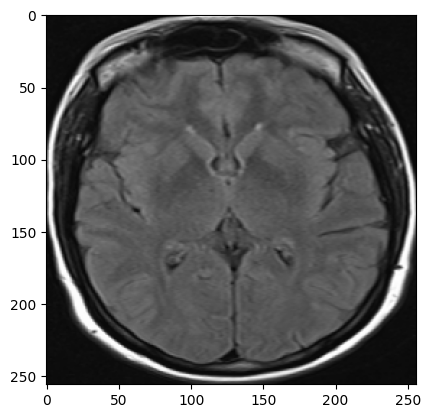

In [ ]:
plt.imshow(X_train_no[0])

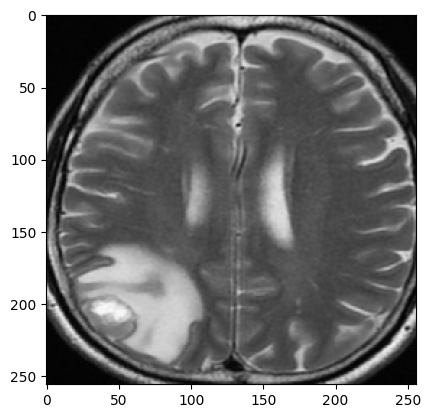

In [ ]:
plt.imshow(X_train_yes[0])

Generate and save

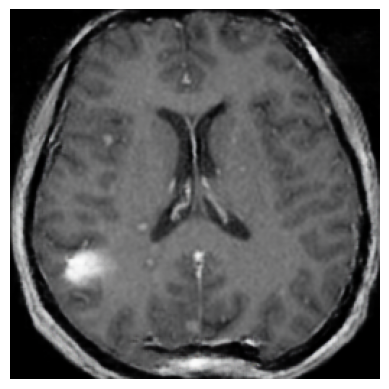

In [ ]:
# _, ax = plt.subplots(10, 2, figsize=(6, 24))
for i, img in enumerate(no_ds):
    # First prediction
    prediction = yes_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    # img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    plt.imshow(prediction)
    plt.axis('off')
    plt.savefig("/content/drive/MyDrive/Data split skripsi/100/generated_data_1/yes/generated_1_yes_{:04d}.png".format(i+1), bbox_inches='tight',pad_inches = 0)

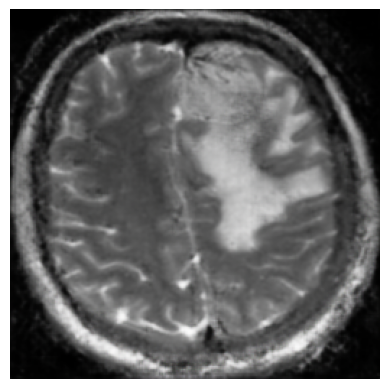

In [ ]:
# _, ax = plt.subplots(10, 2, figsize=(6, 24))
for i, img in enumerate(yes_ds):
    prediction = no_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    # img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    plt.imshow(prediction)
    plt.axis('off')
    plt.savefig("/content/drive/MyDrive/Data split skripsi/100/generated_data_1/no/generated_1_no_{:04d}.png".format(i+1), bbox_inches='tight',pad_inches = 0)

End generate and save